# Analyzing cause_of_deaths in Many Regions

---

### Objectives
- Clean and organize the dataset to ensure accuracy and consistency for further analysis.
- Use Python for in-depth analysis to identify top causes of death globally and regionally.
- Evaluate trends over time, highlighting increases or decreases in specific causes of death.
- Create informative and aesthetically appealing graphs using Matplotlib and Seaborn to visualize the data clearly.
- Going beyond the standard charts by incorporating innovative visual techniques (e.g., animation, heatmaps, etc.).
- Use Python to develop a simple model predicting future trends based on historical data.

---

### Setup
For this lab, we will be using the following libraries:

*   [`pandas`](https://pandas.pydata.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0187ENSkillsNetwork31430127-2021-01-01) for managing the data.
*   [`numpy`](https://numpy.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0187ENSkillsNetwork31430127-2021-01-01) for mathematical operations.
*   [`seaborn`](https://seaborn.pydata.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0187ENSkillsNetwork31430127-2021-01-01) for visualizing the data.
*   [`matplotlib`](https://matplotlib.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0187ENSkillsNetwork31430127-2021-01-01) for additional plotting tools.

### Installing Required Libraries

In [1]:
%pip install seaborn
%pip install folium


Note: you may need to restart the kernel to use updated packages.


### Importing Required Libraries

In [49]:
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
%matplotlib inline

### Load the dataset

In [50]:
try:
    url = 'cause_of_deaths.csv'
    df=pd.read_csv(url)
except FileNotFoundError:
    print("The file 'cause_of_deaths.csv' was not found.")
    exit()
df

,Country/Territory,Code,Year,Meningitis,Alzheimer's Disease and Other Dementias,Parkinson's Disease,Nutritional Deficiencies,Malaria,Drowning,Interpersonal Violence,...,Diabetes Mellitus,Chronic Kidney Disease,Poisonings,Protein-Energy Malnutrition,Road Injuries,Chronic Respiratory Diseases,Cirrhosis and Other Chronic Liver Diseases,Digestive Diseases,"Fire, Heat, and Hot Substances",Acute Hepatitis
0,Afghanistan,AFG,1990,2159,1116,371,2087,93,1370,1538,...,2108,3709,338,2054,4154,5945,2673,5005,323,2985
1,Afghanistan,AFG,1991,2218,1136,374,2153,189,1391,2001,...,2120,3724,351,2119,4472,6050,2728,5120,332,3092
2,Afghanistan,AFG,1992,2475,1162,378,2441,239,1514,2299,...,2153,3776,386,2404,5106,6223,2830,5335,360,3325
3,Afghanistan,AFG,1993,2812,1187,384,2837,108,1687,2589,...,2195,3862,425,2797,5681,6445,2943,5568,396,3601
4,Afghanistan,AFG,1994,3027,1211,391,3081,211,1809,2849,...,2231,3932,451,3038,6001,6664,3027,5739,420,3816
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6115,Zimbabwe,ZWE,2015,1439,754,215,3019,2518,770,1302,...,3176,2108,381,2990,2373,2751,1956,4202,632,146
6116,Zimbabwe,ZWE,2016,1457,767,219,3056,2050,801,1342,...,3259,2160,393,3027,2436,2788,1962,4264,648,146
6117,Zimbabwe,ZWE,2017,1460,781,223,2990,2116,818,1363,...,3313,2196,398,2962,2473,2818,2007,4342,654,144
6118,Zimbabwe,ZWE,2018,1450,795,227,2918,2088,825,1396,...,3381,2240,400,2890,2509,2849,2030,4377,657,139


### Display initial information

In [4]:
df.head()

,Country/Territory,Code,Year,Meningitis,Alzheimer's Disease and Other Dementias,Parkinson's Disease,Nutritional Deficiencies,Malaria,Drowning,Interpersonal Violence,...,Diabetes Mellitus,Chronic Kidney Disease,Poisonings,Protein-Energy Malnutrition,Road Injuries,Chronic Respiratory Diseases,Cirrhosis and Other Chronic Liver Diseases,Digestive Diseases,"Fire, Heat, and Hot Substances",Acute Hepatitis
0,Afghanistan,AFG,1990,2159,1116,371,2087,93,1370,1538,...,2108,3709,338,2054,4154,5945,2673,5005,323,2985
1,Afghanistan,AFG,1991,2218,1136,374,2153,189,1391,2001,...,2120,3724,351,2119,4472,6050,2728,5120,332,3092
2,Afghanistan,AFG,1992,2475,1162,378,2441,239,1514,2299,...,2153,3776,386,2404,5106,6223,2830,5335,360,3325
3,Afghanistan,AFG,1993,2812,1187,384,2837,108,1687,2589,...,2195,3862,425,2797,5681,6445,2943,5568,396,3601
4,Afghanistan,AFG,1994,3027,1211,391,3081,211,1809,2849,...,2231,3932,451,3038,6001,6664,3027,5739,420,3816


In [5]:
df.describe()

,Year,Meningitis,Alzheimer's Disease and Other Dementias,Parkinson's Disease,Nutritional Deficiencies,Malaria,Drowning,Interpersonal Violence,Maternal Disorders,HIV/AIDS,...,Diabetes Mellitus,Chronic Kidney Disease,Poisonings,Protein-Energy Malnutrition,Road Injuries,Chronic Respiratory Diseases,Cirrhosis and Other Chronic Liver Diseases,Digestive Diseases,"Fire, Heat, and Hot Substances",Acute Hepatitis
count,6120.000000,6120.000000,6120.000000,6120.000000,6120.000000,6120.000000,6120.000000,6120.000000,6120.000000,6120.000000,...,6120.000000,6120.000000,6120.000000,6120.000000,6120.000000,6.120000e+03,6120.000000,6120.000000,6120.000000,6120.000000
mean,2004.500000,1719.701307,4864.189379,1173.169118,2253.600000,4140.960131,1683.333170,2083.797222,1262.589216,5941.898529,...,5138.704575,4724.132680,425.013399,1965.994281,5930.795588,1.709237e+04,6124.072059,10725.267157,588.711438,618.429902
std,8.656149,6672.006930,18220.659072,4616.156238,10483.633601,18427.753137,8877.018366,6917.006075,6057.973183,21011.962487,...,16773.081040,16470.429969,2022.640521,8255.999063,24097.784291,1.051572e+05,20688.118580,37228.051096,2128.595120,4186.023497
min,1990.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,1997.000000,15.000000,90.000000,27.000000,9.000000,0.000000,34.000000,40.000000,5.000000,11.000000,...,236.000000,145.750000,6.000000,5.000000,174.750000,2.890000e+02,154.000000,284.000000,17.000000,2.000000
50%,2004.500000,109.000000,666.500000,164.000000,119.000000,0.000000,177.000000,265.000000,54.000000,136.000000,...,1087.000000,822.000000,52.500000,92.000000,966.500000,1.689000e+03,1210.000000,2185.000000,126.000000,15.000000
75%,2012.000000,847.250000,2456.250000,609.250000,1167.250000,393.000000,698.000000,877.000000,734.000000,1879.000000,...,2954.000000,2922.500000,254.000000,1042.500000,3435.250000,5.249750e+03,3547.250000,6080.000000,450.000000,160.000000
max,2019.000000,98358.000000,320715.000000,76990.000000,268223.000000,280604.000000,153773.000000,69640.000000,107929.000000,305491.000000,...,273089.000000,222922.000000,30883.000000,202241.000000,329237.000000,1.366039e+06,270037.000000,464914.000000,25876.000000,64305.000000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6120 entries, 0 to 6119
Data columns (total 34 columns):
 #   Column                                      Non-Null Count  Dtype 
---  ------                                      --------------  ----- 
 0   Country/Territory                           6120 non-null   object
 1   Code                                        6120 non-null   object
 2   Year                                        6120 non-null   int64 
 3   Meningitis                                  6120 non-null   int64 
 4   Alzheimer's Disease and Other Dementias     6120 non-null   int64 
 5   Parkinson's Disease                         6120 non-null   int64 
 6   Nutritional Deficiencies                    6120 non-null   int64 
 7   Malaria                                     6120 non-null   int64 
 8   Drowning                                    6120 non-null   int64 
 9   Interpersonal Violence                      6120 non-null   int64 
 10  Maternal Disorders      

In [7]:
df.columns

Index(['Country/Territory', 'Code', 'Year', 'Meningitis',
       'Alzheimer's Disease and Other Dementias', 'Parkinson's Disease',
       'Nutritional Deficiencies', 'Malaria', 'Drowning',
       'Interpersonal Violence', 'Maternal Disorders', 'HIV/AIDS',
       'Drug Use Disorders', 'Tuberculosis', 'Cardiovascular Diseases',
       'Lower Respiratory Infections', 'Neonatal Disorders',
       'Alcohol Use Disorders', 'Self-harm', 'Exposure to Forces of Nature',
       'Diarrheal Diseases', 'Environmental Heat and Cold Exposure',
       'Neoplasms', 'Conflict and Terrorism', 'Diabetes Mellitus',
       'Chronic Kidney Disease', 'Poisonings', 'Protein-Energy Malnutrition',
       'Road Injuries', 'Chronic Respiratory Diseases',
       'Cirrhosis and Other Chronic Liver Diseases', 'Digestive Diseases',
       'Fire, Heat, and Hot Substances', 'Acute Hepatitis'],
      dtype='object')

---

## Data Cleaning & Processing: To clean and organize the dataset, you can use Python libraries such as Pandas and NumPy. Here are some steps you can follow:

### 1- Handle missing values: Use Pandas to identify and handle missing values in the dataset.

In [8]:
# Find duplicated Raws
print(df.duplicated().sum())

0


In [9]:
df.isnull().sum()

Country/Territory                             0
Code                                          0
Year                                          0
Meningitis                                    0
Alzheimer's Disease and Other Dementias       0
Parkinson's Disease                           0
Nutritional Deficiencies                      0
Malaria                                       0
Drowning                                      0
Interpersonal Violence                        0
Maternal Disorders                            0
HIV/AIDS                                      0
Drug Use Disorders                            0
Tuberculosis                                  0
Cardiovascular Diseases                       0
Lower Respiratory Infections                  0
Neonatal Disorders                            0
Alcohol Use Disorders                         0
Self-harm                                     0
Exposure to Forces of Nature                  0
Diarrheal Diseases                      

In [10]:
# Find the missing data
Missing_values = df.isnull()
for column in Missing_values.columns.values.tolist():
    print(column)
    print(Missing_values[column].value_counts())
    print("")

Country/Territory
Country/Territory
False    6120
Name: count, dtype: int64

Code
Code
False    6120
Name: count, dtype: int64

Year
Year
False    6120
Name: count, dtype: int64

Meningitis
Meningitis
False    6120
Name: count, dtype: int64

Alzheimer's Disease and Other Dementias
Alzheimer's Disease and Other Dementias
False    6120
Name: count, dtype: int64

Parkinson's Disease
Parkinson's Disease
False    6120
Name: count, dtype: int64

Nutritional Deficiencies
Nutritional Deficiencies
False    6120
Name: count, dtype: int64

Malaria
Malaria
False    6120
Name: count, dtype: int64

Drowning
Drowning
False    6120
Name: count, dtype: int64

Interpersonal Violence
Interpersonal Violence
False    6120
Name: count, dtype: int64

Maternal Disorders
Maternal Disorders
False    6120
Name: count, dtype: int64

HIV/AIDS
HIV/AIDS
False    6120
Name: count, dtype: int64

Drug Use Disorders
Drug Use Disorders
False    6120
Name: count, dtype: int64

Tuberculosis
Tuberculosis
False    6120
Name:

In [11]:
# Handle missing values
# def fill_with_mean(column):
#    mean_value = column.mean()
#   return column.fillna(mean_value)

# columns_to_clean = ['Meningitis', 'Alzheimer\'s Disease and Other Dementias', 'Parkinson\'s Disease', 'Nutritional Deficiencies',
#                   'Malaria', 'Drowning', 'Interpersonal Violence', 'Maternal Disorders', 'HIV/AIDS', 'Drug Use Disorders', 'Tuberculosis',
 #                  'Lower Respiratory Infections', 'Neonatal Disorders', 'Alcohol Use Disorders', 'Self-harm', 'Exposure to Forces of Nature',
  #                 'Diarrheal Diseases', 'Environmental Heat and Cold Exposure', 'Conflict and Terrorism', 'Chronic Kidney Disease',
   #                'Poisonings', 'Protein-Energy Malnutrition', 'Road Injuries', 'Cirrhosis and Other Chronic Liver Diseases', 'Digestive Diseases',
    #               'Fire, Heat, and Hot Substances', 'Acute Hepatitis'] 

# for column in columns_to_clean:
    #df[column].fillna(fill_with_mean(df[column]), inplace=True)

In [12]:
# Ensure correct data types
df['Year'] = df['Year'].astype(int)  # Ensure 'Year' is an integer

In [13]:
# Standardize column names if needed (remove special characters)
df.columns = df.columns.str.replace("'", "")

---

## Identify top causes of death globally and regionally.

Cardiovascular Diseases                       447741982
Neoplasms                                     229758538
Chronic Respiratory Diseases                  104605334
Lower Respiratory Infections                   83770038
Neonatal Disorders                             76860729
Diarrheal Diseases                             66235508
Digestive Diseases                             65638635
Tuberculosis                                   45850603
Cirrhosis and Other Chronic Liver Diseases     37479321
HIV/AIDS                                       36364419
Road Injuries                                  36296469
Diabetes Mellitus                              31448872
Alzheimers Disease and Other Dementias         29768839
Chronic Kidney Disease                         28911692
Malaria                                        25342676
Self-harm                                      23713931
Nutritional Deficiencies                       13792032
Interpersonal Violence                         1

C:\Users\Mohamed Khater\AppData\Local\Temp\ipykernel_4696\477889171.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=global_deaths.index[:15], y=global_deaths.values[:15], palette='viridis')


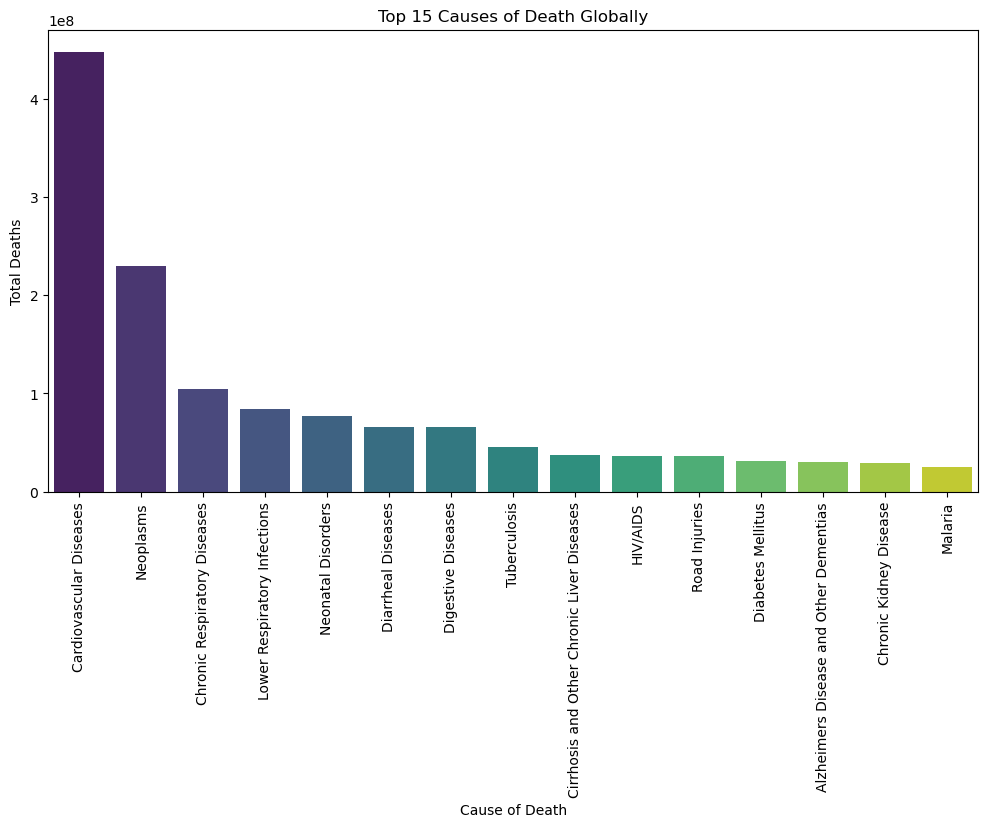

In [14]:
# Summarize the top causes of death globally
global_deaths = df.iloc[:, 3:].sum().sort_values(ascending=False)
print(global_deaths)

# Plot the top 10 causes of death globally
plt.figure(figsize=(12, 6))
sns.barplot(x=global_deaths.index[:15], y=global_deaths.values[:15], palette='viridis')
plt.xticks(rotation=90)
plt.title('Top 15 Causes of Death Globally')
plt.xlabel('Cause of Death')
plt.ylabel('Total Deaths')
plt.show()

By identifying the top 15 causes of death globally we can notice that the **highest** one was **Cardiovascular Disease**.

In [15]:
# Grouping by 'Country/Territory' and 'Year' for regional analysis
regional_deaths = df.groupby(['Country/Territory', 'Year']).sum().reset_index()
print(regional_deaths.head())

  Country/Territory  Year Code  Meningitis  \
0       Afghanistan  1990  AFG        2159   
1       Afghanistan  1991  AFG        2218   
2       Afghanistan  1992  AFG        2475   
3       Afghanistan  1993  AFG        2812   
4       Afghanistan  1994  AFG        3027   

   Alzheimers Disease and Other Dementias  Parkinsons Disease  \
0                                    1116                 371   
1                                    1136                 374   
2                                    1162                 378   
3                                    1187                 384   
4                                    1211                 391   

   Nutritional Deficiencies  Malaria  Drowning  Interpersonal Violence  ...  \
0                      2087       93      1370                    1538  ...   
1                      2153      189      1391                    2001  ...   
2                      2441      239      1514                    2299  ...   
3               

---

## Evaluate trends over time, highlighting increases or decreases in specific causes of death.

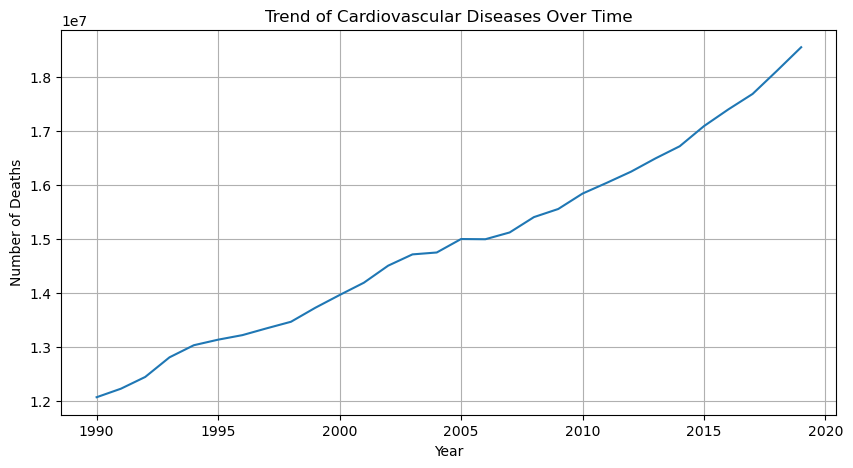

In [16]:
# Trend analysis for Cardiovascular Diseases globally
cvd_trend = df.groupby('Year')['Cardiovascular Diseases'].sum()
# Plot the  Cardiovascular Diseases causes of death globally
plt.figure(figsize=(10, 5))
sns.lineplot(x=cvd_trend.index, y=cvd_trend.values)
plt.title('Trend of Cardiovascular Diseases Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Deaths')
plt.grid(True)
plt.show()

By Analysing the trend Of **Cardiovascular Disease** we can see it getting increased from **2006 to 2020**.

---

## Create informative and aesthetically appealing graphs using Matplotlib and Seaborn to visualize the data clearly.

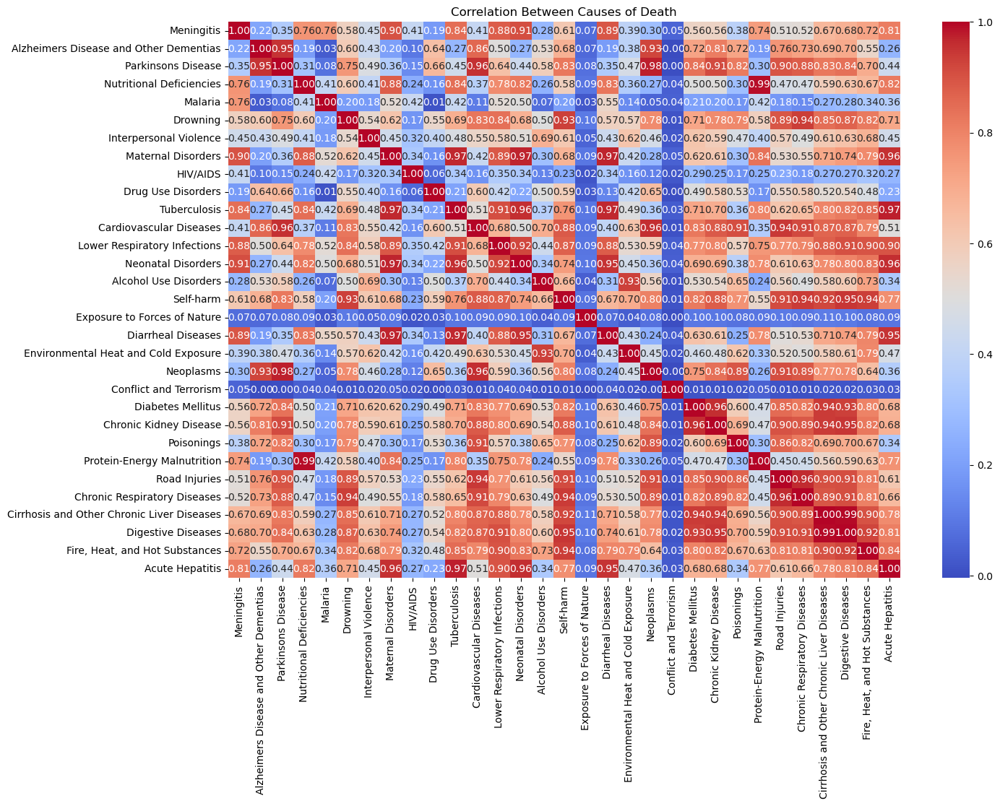

In [17]:
# Advanced Visualizations
# Heatmap of causes of death correlations
plt.figure(figsize=(15, 10))
correlation_matrix = df.iloc[:, 3:].corr()
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, fmt=".2f")
plt.title('Correlation Between Causes of Death')
plt.show()

The plot represent a correlation matrix, visualizing the relationships between different variables.

Based on the colors, it seems that there are several strong positive and negative correlations between the variables.

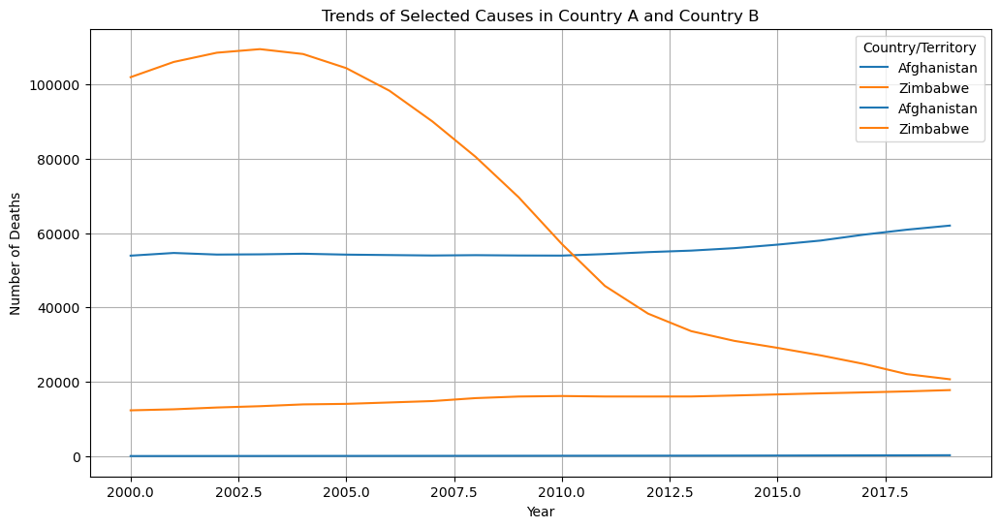

In [18]:
# Compare top causes in two selected countries over a specific period
countries = ['Afghanistan', 'Zimbabwe']  # Replace with actual country names
selected_countries = df[df['Country/Territory'].isin(countries) & (df['Year'] >= 2000) & (df['Year'] <= 2020)]
grouped_countries = selected_countries.groupby(['Country/Territory', 'Year']).sum()

# Plot trends for selected causes
plt.figure(figsize=(12, 6))
for cause in ['Cardiovascular Diseases', 'HIV/AIDS']:  # Add more causes if needed
    sns.lineplot(data=grouped_countries, x='Year', y=cause, hue='Country/Territory')

plt.title('Trends of Selected Causes in Country A and Country B')
plt.xlabel('Year')
plt.ylabel('Number of Deaths')
plt.legend(title='Country/Territory')
plt.grid(True)
plt.show()


The plot represent a line chart showing trends of selected causes of death in Country A and Country B over time.


**Overall Trends**: Both countries show a general decline in the number of deaths for most causes over the years.

**Specific Cause Trends**: Some causes show more significant declines or increases than others. For example, one cause might have a steep decline in Country A but remain relatively stable in Country B.

<Figure size 1500x1000 with 0 Axes>

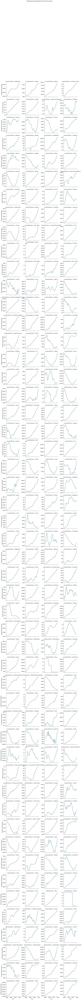

In [19]:
# Facet Grid for Multi-dimensional Analysis of Causes of Death Over Time by Country
plt.figure(figsize=(15, 10))

# Creating a facet grid with seaborn
g = sns.FacetGrid(regional_deaths, col="Country/Territory", col_wrap=4, height=3, sharey=False)
g.map(sns.lineplot, "Year", "Cardiovascular Diseases")  # Change to other causes as needed

plt.subplots_adjust(top=0.9)
g.fig.suptitle('Cardiovascular Diseases Over Time by Country')
plt.show()

The plot represents  **Cardiovascular Diseases Over Time by Country**
We can notice by deep analysis that the highest country is **China**.

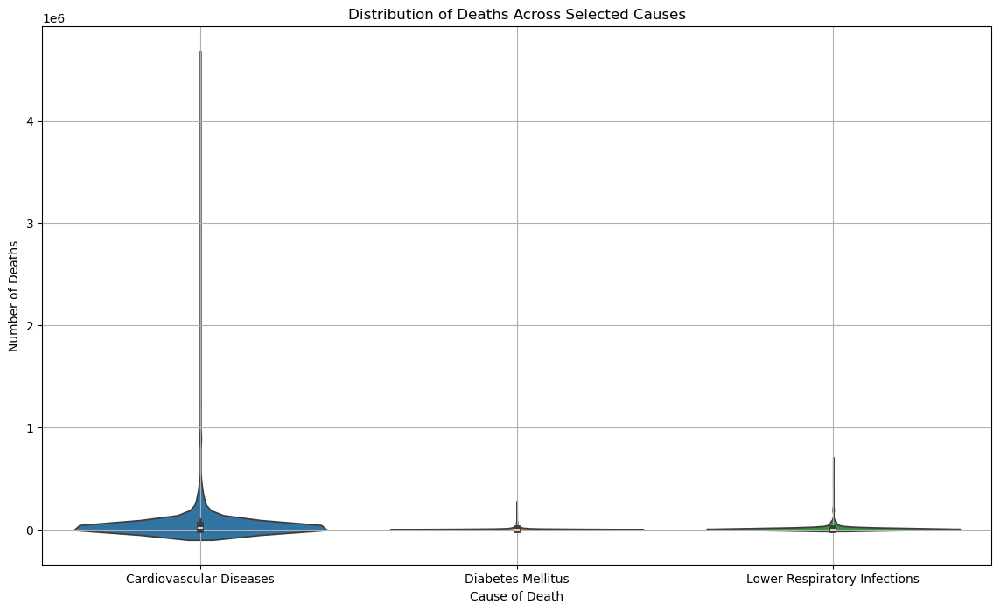

In [20]:
# Violin Plots for Distribution of Deaths Across Causes
plt.figure(figsize=(14, 8))

# Selecting a subset of the data to plot
causes_to_plot = ['Cardiovascular Diseases', 'Diabetes Mellitus', 'Lower Respiratory Infections']
sns.violinplot(data=df[causes_to_plot])

plt.title('Distribution of Deaths Across Selected Causes')
plt.xlabel('Cause of Death')
plt.ylabel('Number of Deaths')
plt.grid(True)
plt.show()

Distribution of Deaths Across Selected Causes.
We can notice that the **highest** cause distribution belongs to **Cardiovascular Disease**.

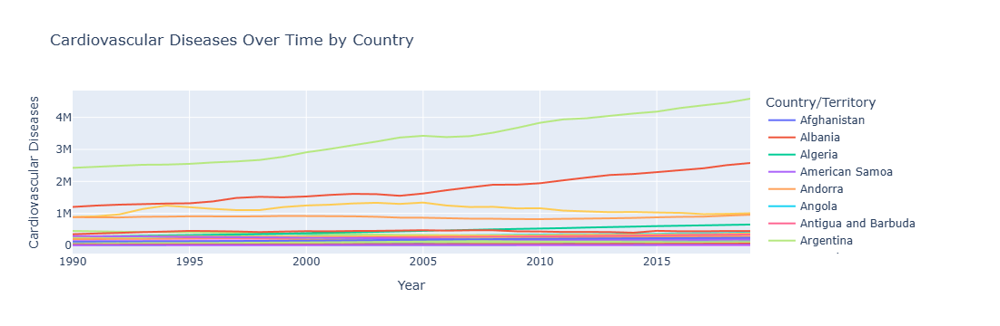

In [21]:
import plotly.express as px

# Interactive Line Plot for Cardiovascular Diseases Over Time by Country
fig = px.line(regional_deaths, x='Year', y='Cardiovascular Diseases', color='Country/Territory',
              title='Cardiovascular Diseases Over Time by Country')
fig.show()

Line plot represents Cardiovascular Diseases Over Time by Country.
The **Highest** record recorded in **China**.

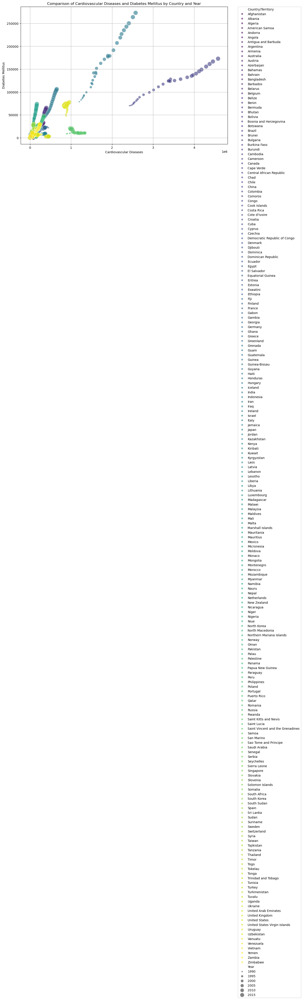

In [22]:
# Bubble Plot for Multi-variable Comparison
plt.figure(figsize=(12, 8))

# Example: Bubble plot for 'Cardiovascular Diseases' vs 'Diabetes Mellitus' with bubble size by 'Year'
sns.scatterplot(data=regional_deaths, x='Cardiovascular Diseases', y='Diabetes Mellitus',
                size='Year', hue='Country/Territory', sizes=(20, 200), alpha=0.6, palette='viridis')

plt.title('Comparison of Cardiovascular Diseases and Diabetes Mellitus by Country and Year')
plt.xlabel('Cardiovascular Diseases')
plt.ylabel('Diabetes Mellitus')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.grid(True)
plt.show()


Comparison of **Cardiovascular Diseases and Diabetes Mellitus** by Country and Year.

In [23]:
from folium.plugins import MarkerCluster

# Prepare the data
# Assuming you have a dataset with 'Country' and 'Cardiovascular Diseases' columns
# Example subset of the data
regional_deaths = df.groupby(['Country/Territory']).sum().reset_index()
regional_deaths = regional_deaths[['Country/Territory', 'Cardiovascular Diseases']]

# Load GeoJSON file for world countries
world_geo = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/world-countries.json'

# Initialize the Folium map centered on a world view
m = folium.Map(location=[20, 0], zoom_start=2)

# Create a Choropleth map
folium.Choropleth(
    geo_data=world_geo,
    data=regional_deaths,
    columns=['Country/Territory', 'Cardiovascular Diseases'],
    key_on='feature.properties.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Cardiovascular Diseases Deaths'
).add_to(m)

# Display the map
m.save('choropleth_map.html')
m

## Global Cardiovascular Disease Deaths: Interactive Marker Cluster Map

In [24]:
# Create a dictionary with sample latitude and longitude for a few countries
country_coordinates = {
    'United States': [37.0902, -95.7129],
    'India': [20.5937, 78.9629],
    'China': [35.8617, 104.1954],
    'Brazil': [-14.2350, -51.9253],
    'Russia': [61.5240, 105.3188],
    'Nigeria': [9.0820, 8.6753],
    'Egypt': [26.8206, 30.8025],
    # Add more countries as needed
}

# Adding latitude and longitude to the DataFrame
# You may need to ensure country names in your dataset match the keys in the dictionary
regional_deaths['Latitude'] = regional_deaths['Country/Territory'].map(lambda x: country_coordinates.get(x, [0, 0])[0])
regional_deaths['Longitude'] = regional_deaths['Country/Territory'].map(lambda x: country_coordinates.get(x, [0, 0])[1])

# Check the updated DataFrame
print(regional_deaths.head())

  Country/Territory  Cardiovascular Diseases  Latitude  Longitude
0       Afghanistan                  1607042       0.0        0.0
1           Albania                   270603       0.0        0.0
2           Algeria                  2123720       0.0        0.0
3    American Samoa                     2851       0.0        0.0
4           Andorra                     3526       0.0        0.0


In [25]:
# Initialize the map
m = folium.Map(location=[20, 0], zoom_start=2)

# Add a marker cluster
marker_cluster = MarkerCluster().add_to(m)

# Add markers to the cluster using the updated DataFrame with coordinates
for index, row in regional_deaths.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['Country/Territory']}: {row['Cardiovascular Diseases']} deaths",
        icon=folium.Icon(color='red', icon='info-sign')
    ).add_to(marker_cluster)

# Save and display the map
m.save('marker_cluster_map.html')
m

## Linear Regression Forecast of Cardiovascular Disease Deaths

In [26]:
forecast_data = df.groupby('Year')['Cardiovascular Diseases'].sum().reset_index()
x= forecast_data['Year'].values.reshape(-1,1)
y= forecast_data['Cardiovascular Diseases'].values

In [27]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size= 0.2, random_state= 42)

In [28]:
linear_model = LinearRegression()
linear_model.fit(x_train, y_train)
y_pred_linear = linear_model.predict(x_test)

In [29]:
def plot_predictions(X, y, X_test, y_test, y_pred, model_name):
    plt.figure(figsize=(10,6))
    plt.scatter(X, y, color= 'blue', label='Actual Data')
    plt.plot( X_test, y_pred,color= 'red', linewidth=2, label=f'{model_name} prediction')
    plt.title(f'{model_name} - Forecast of Cardiovascular Diseases Deaths')
    plt.xlabel('Year')
    plt.ylabel('Number of Deaths')
    plt.legend()
    plt.grid(True)
    plt.show()

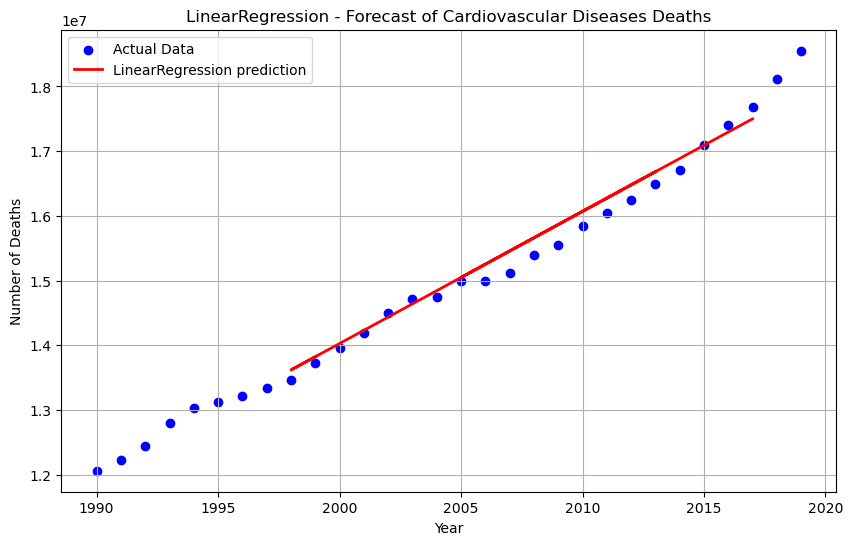

In [30]:
plot_predictions(x, y, x_test, y_test, y_pred_linear ,'LinearRegression' )

A **linear regression model** predicting the number of cardiovascular disease deaths over time.

In [31]:
mse_linear = mean_squared_error(y_test, y_pred_linear)
r2_linear = r2_score(y_test, y_pred_linear)
print(f'Linear Regression - MSE :{mse_linear}, R-squard :{r2_linear}')

Linear Regression - MSE :37606101782.926506, R-squard :0.9827637766379665


## Polynomial Regression (Degree 3) Forecast of Cardiovascular Disease Deaths

In [32]:
poly_features = PolynomialFeatures(degree=3)
x_poly = poly_features.fit_transform(x_train)
x_test_poly= poly_features.transform(x_test)

In [33]:
poly_model = LinearRegression()
poly_model.fit(x_poly, y_train)
y_pred_poly = poly_model.predict(x_test_poly)

In [34]:
def plot_predictions(X, y, X_test, y_test, y_pred, model_name):
    plt.figure(figsize=(10,6))
    plt.scatter(X, y, color= 'blue', label='Actual Data')
    plt.plot( X_test, y_pred,color= 'red', linewidth=2, label=f'{model_name} prediction')
    plt.title(f'{model_name} - Forecast of Cardiovascular Diseases Deaths')
    plt.xlabel('Year')
    plt.ylabel('Number of Deaths')
    plt.legend()
    plt.grid(True)
    plt.show()

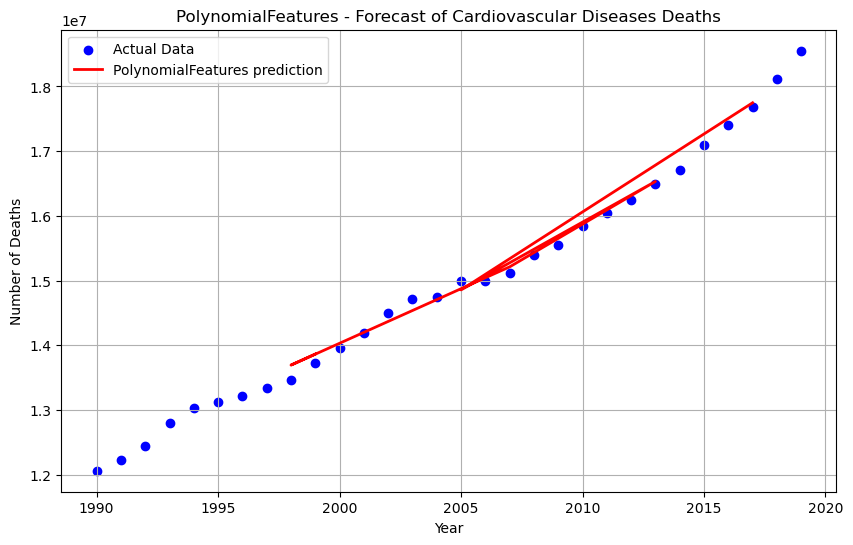

In [35]:
plot_predictions(x, y, x_test, y_test, y_pred_poly, 'PolynomialFeatures' )

A **polynomialfeatures model** predicting the number of cardiovascular disease deaths over time.

In [36]:
mse_poly = mean_squared_error(y_test,  y_pred_poly)
r2_poly = r2_score(y_test, y_pred_poly)
print(f'Polynomial Regression - MSE :{mse_poly}, R-squard :{r2_poly}')

Polynomial Regression - MSE :18162030902.540035, R-squard :0.9916756907389306


## Ridge Regression Forecast of Cardiovascular Disease Deaths

In [37]:
ridge_model = Ridge(alpha=1.0)
ridge_model.fit(x_train, y_train)
y_pred_ridge = ridge_model.predict(x_test)

In [38]:
def plot_predictions(X, y, X_test, y_test, y_pred, model_name):
    plt.figure(figsize=(10,6))
    plt.scatter(X, y, color= 'blue', label='Actual Data')
    plt.plot( X_test, y_pred,color= 'red', linewidth=2, label=f'{model_name} prediction')
    plt.title(f'{model_name} - Forecast of Cardiovascular Diseases Deaths')
    plt.xlabel('Year')
    plt.ylabel('Number of Deaths')
    plt.legend()
    plt.grid(True)
    plt.show()

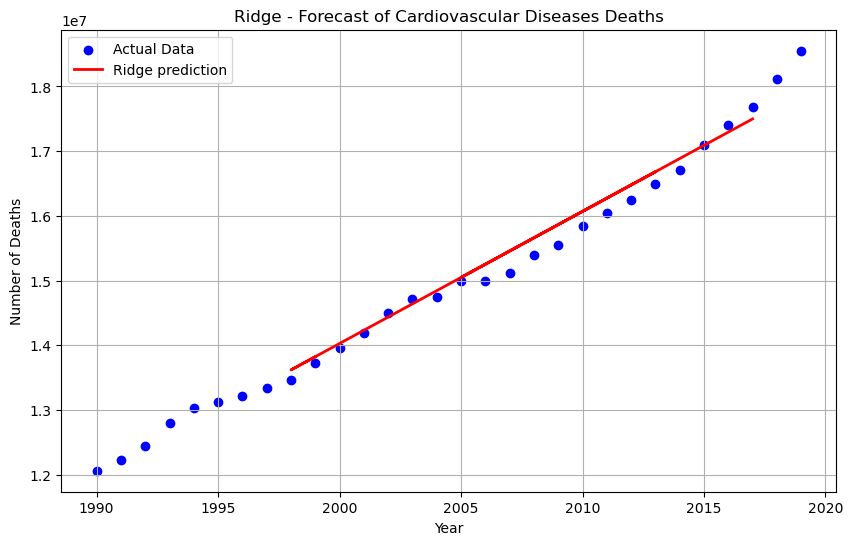

In [39]:
plot_predictions(x, y, x_test, y_test, y_pred_ridge, 'Ridge' )

A **ridge model** predicting the number of cardiovascular disease deaths over time.

In [40]:
mse = mean_squared_error(y_test, y_pred_ridge)
print(f"Mean Squared Error: {mse}")
r2_ridge= r2_score(y_test, y_pred_ridge)
print(f"R-squard: {r2_ridge}")

Mean Squared Error: 37644433559.24207
R-squard: 0.9827462078119752


## Performance Evaluation of Polynomial Regression (Degree 3) for Cardiovascular Disease Deaths

In [41]:
# Initialize polynomial features and model pipeline
poly = PolynomialFeatures(degree=3)
poly_model = make_pipeline(poly, LinearRegression())

# Train the model
poly_model.fit(x_train, y_train)

# Make predictions
y_pred_poly = poly_model.predict(x_test)

# Evaluate the model
mse_poly = mean_squared_error(y_test, y_pred_poly)
mae_poly = mean_absolute_error(y_test, y_pred_poly)
print(f"Polynomial Regression Mean Squared Error: {mse_poly:.2f}")
print(f"Polynomial Regression Mean Absolute Error: {mae_poly:.2f}")

Polynomial Regression Mean Squared Error: 18162030902.54
Polynomial Regression Mean Absolute Error: 119166.12


In [42]:
def plot_predictions(X, y, X_test, y_test, y_pred, model_name):
    plt.figure(figsize=(10,6))
    plt.scatter(X, y, color= 'blue', label='Actual Data')
    plt.plot( X_test, y_pred_poly, color= 'red', linewidth=2, label=f'{model_name} prediction')
    plt.title(f'{model_name} - Forecast of Cardiovascular Diseases Deaths')
    plt.xlabel('Year')
    plt.ylabel('Number of Deaths')
    plt.legend()
    plt.grid(True)
    plt.show()

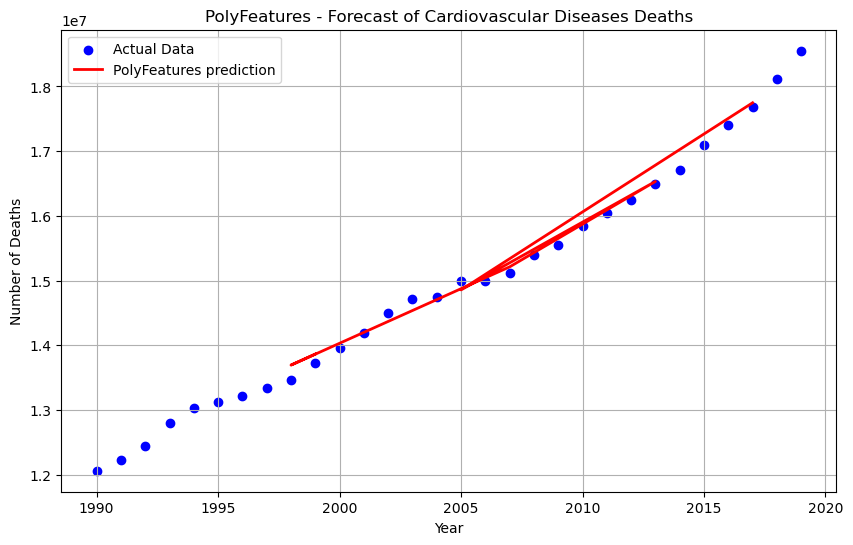

In [43]:
plot_predictions(x, y, x_test, y_test, y_pred_poly, 'PolyFeatures' )

A **polyfeatures model 'polynomial features and model pipeline'** predicting the number of cardiovascular disease deaths over time.

## Box Plot of Cardiovascular Disease Deaths 

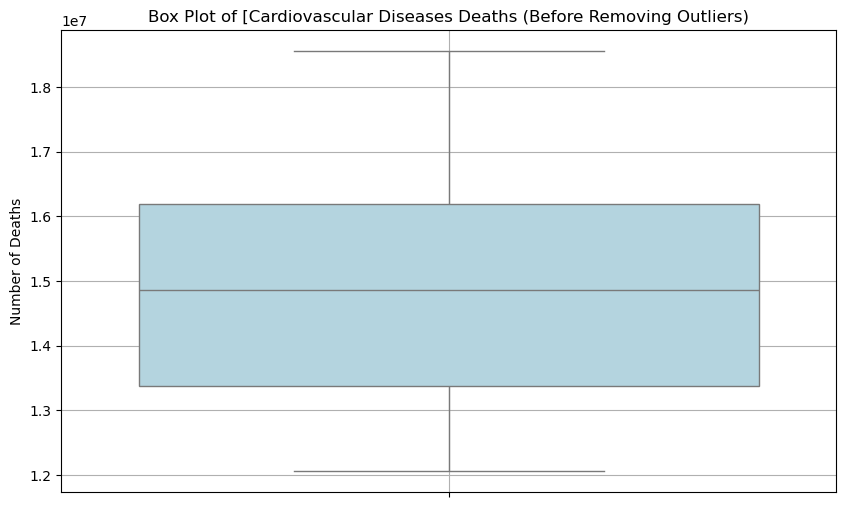

In [44]:
plt.figure(figsize=(10,6))
sns.boxplot(y =forecast_data['Cardiovascular Diseases'], color='lightblue')
plt.title('Box Plot of [Cardiovascular Diseases Deaths (Before Removing Outliers)')
plt.ylabel('Number of Deaths')
plt.grid(True)
plt.show()

Detecting the outliers.

## Scatter Plot of Cardiovascular Disease Deaths 

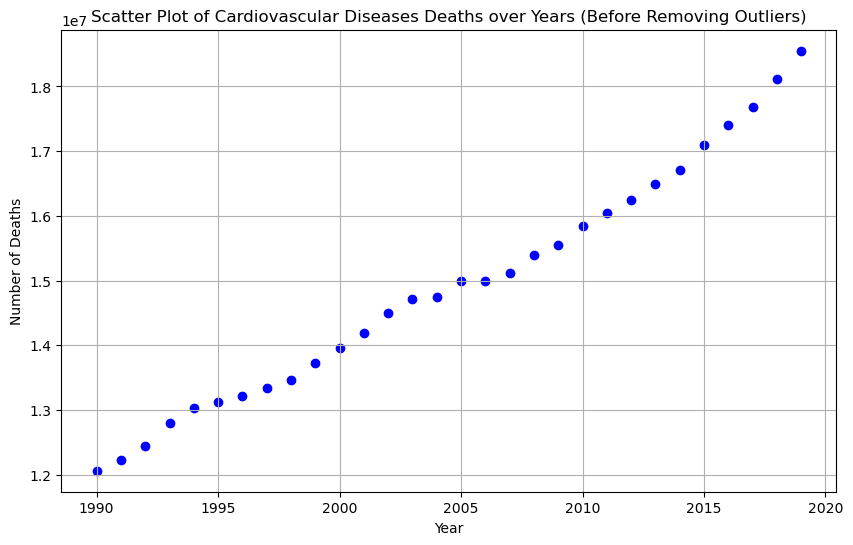

In [45]:
plt.figure(figsize = (10, 6))
plt.scatter(forecast_data['Year'], forecast_data['Cardiovascular Diseases'], color = 'blue')
plt.title('Scatter Plot of Cardiovascular Diseases Deaths over Years (Before Removing Outliers)')
plt.xlabel('Year')
plt.ylabel('Number of Deaths')
plt.grid(True)
plt.show()

Scatter plot of **cardiovascular disease** over years **befor removing outliers**.

In [46]:
Q1 = forecast_data['Cardiovascular Diseases'].quantile(0.25)
Q3 = forecast_data['Cardiovascular Diseases'].quantile(0.75)
IQR = Q3 - Q1

Lower_bound = Q1 - 1.5*IQR
Upper_bound = Q3 +1.5*IQR

print (f"lower_bound : {Lower_bound}, upper_bound : {Upper_bound}")

filterd_data = forecast_data[(forecast_data['Cardiovascular Diseases'] >= Lower_bound) &
                             (forecast_data['Cardiovascular Diseases']  <= Upper_bound)]

print (f"Original data size: {forecast_data.shape[0]}, Filterd data size: {filterd_data.shape[0]}")

lower_bound : 9135499.875, upper_bound : 20428296.875
Original data size: 30, Filterd data size: 30


Determine the **Lower_Bound** and **Upper_Bound**.

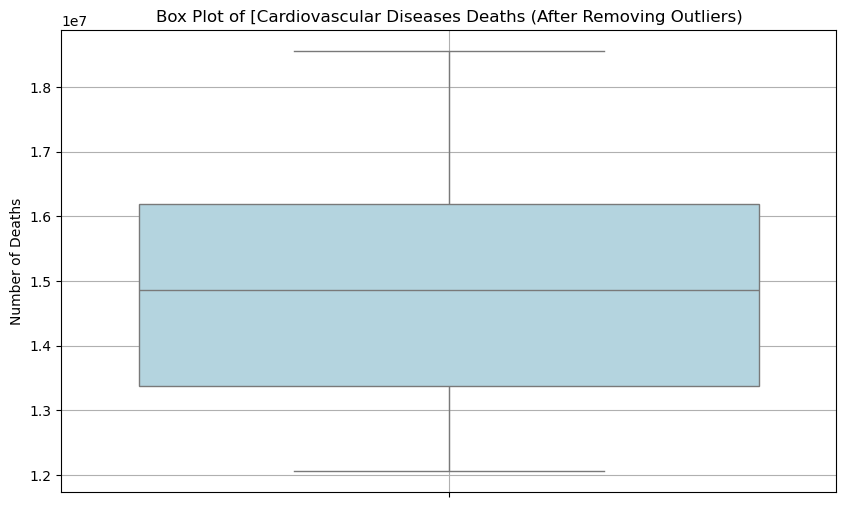

In [47]:
plt.figure(figsize=(10,6))
sns.boxplot(y = filterd_data['Cardiovascular Diseases'], color='lightblue')
plt.title('Box Plot of [Cardiovascular Diseases Deaths (After Removing Outliers)')
plt.ylabel('Number of Deaths')
plt.grid(True)
plt.show()

Detecting if there is any remaining outliers.

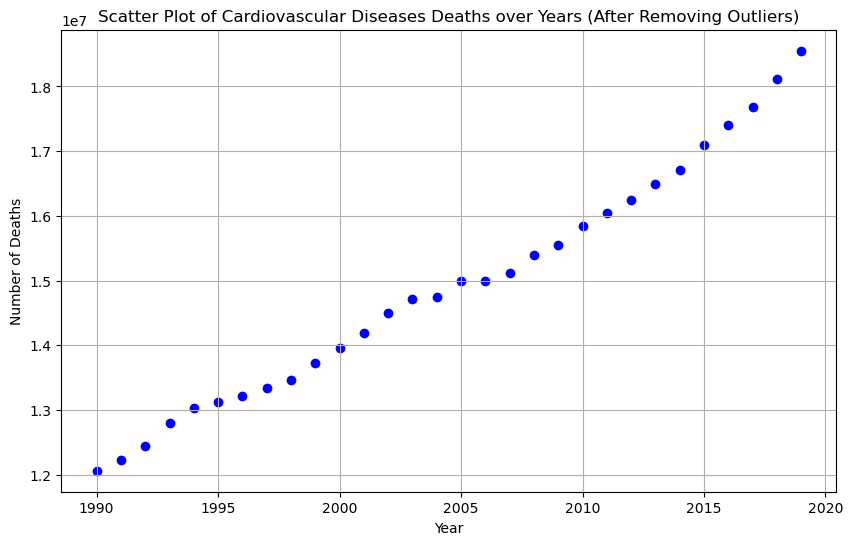

In [48]:
plt.figure(figsize = (10, 6))
plt.scatter(forecast_data['Year'], filterd_data['Cardiovascular Diseases'], color = 'blue')
plt.title('Scatter Plot of Cardiovascular Diseases Deaths over Years (After Removing Outliers)')
plt.xlabel('Year')
plt.ylabel('Number of Deaths')
plt.grid(True)
plt.show()

Scatter plot of **cardiovascular disease** over years **after removing outliers**.